In [1]:
from graph_tool.all import *
import math
import numpy as np
import numpy.random as rd
import matplotlib.pyplot as plt
import matplotlib
import scipy as sp

def create_graph():
    hubs = np.array([[0,0], [1,1], [1/2, 1/2], [0, 1], [1, 0], [1/2, 0], [0, 1/2], [1/2, 1], [1, 1/2]])
    points = np.empty((size, 2))
    for i in range(num_hubs):
        points[comm_size*i:comm_size*(i+1), :] = np.random.normal(hubs[i, :], 0.1, (comm_size, 2))
    g, pos = geometric_graph(points, 0.22)
    return (g, pos, points)

def get_transition_matrix(g, p):
    A = adjacency(g).toarray()
    K = A*(1 + A.dot(np.transpose(A)))
    size = np.size(A, 0)
    L = np.zeros((size, size))

    vs = g.get_vertices()
    degs = g.get_total_degrees(vs)
    for v in vs:
        Kv = np.sum(K[v, :])
        L[v, v] = -1/(degs[v]**p)
        for ne in g.get_all_neighbors(v):
            L[v, ne] = K[v,ne]/(Kv*(degs[v]**(p)))

    return sp.linalg.expm(1000*L)

def get_evals_evecs(P):
    evals, evecs = sp.sparse.linalg.eigs(P, k = 20)
    evals = abs(evals)
    order = np.argsort(-evals)
    evals = evals[order]
    evecs = np.real(evecs[:, order])
    return (evals, evecs)

'''
def plot_communities(num_hubs, points, evecs):
    x = list(map(lambda x: x[0], points))
    y = list(map(lambda x: x[1], points))
    for j in range(num_hubs-1):
        plt.figure(j+1)
        plt.scatter(x, y, c=evecs[:, j+1])
'''
        
def graph_plot_communities(num_hubs, evecs, pos):
    vc = g.new_vertex_property('vector<double>')
    cmap = matplotlib.cm.get_cmap('coolwarm', 50)
    for i in range(num_hubs-1):
        max_ev = np.amax(evecs[:, i+1])
        min_ev = np.amin(evecs[:, i+1])
        for v in g.get_vertices():
            vc[v] = cmap((evecs[v, i+1] - min_ev)/(max_ev - min_ev))
        plot_color_bar(vmin=min_ev, vmax=max_ev)
        plt.show()
        graph_draw(g, pos=pos, vertex_fill_color = vc)
        
def graphviz_plot_communities(num_hubs, evecs):
    vc = g.new_vertex_property('double')
    for i in range(num_hubs-1):
        for v in g.get_vertices():
            vc[v] = evecs[v, i+1]
        graphviz_draw(g, pos=pos, pin=True, vcolor = vc, vcmap = matplotlib.cm.get_cmap('coolwarm'))
    
def plot_color_bar(vmin=0, vmax = 1):
    fig, ax = plt.subplots(figsize=(6, 1))
    fig.subplots_adjust(bottom=0.5)
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    matplotlib.colorbar.ColorbarBase(ax, cmap=matplotlib.cm.coolwarm, norm=norm, orientation='horizontal')
    
def plot_evecs(num_hubs, evecs):
    for i in range(num_hubs-1):
        plt.figure(i+1)
        plt.plot(evecs[:, i+1])
        


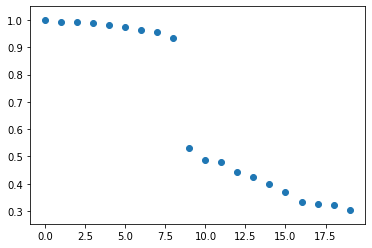

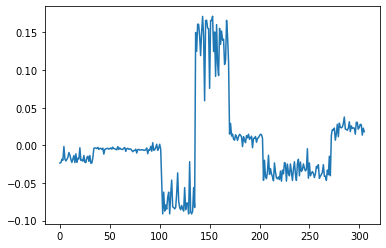

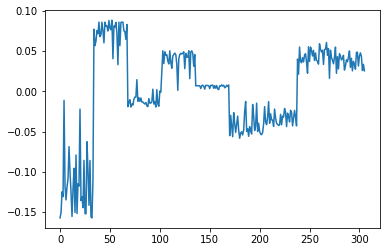

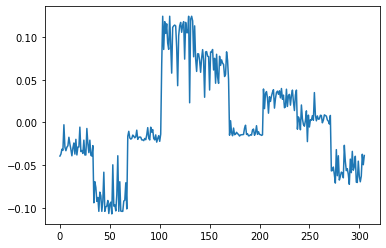

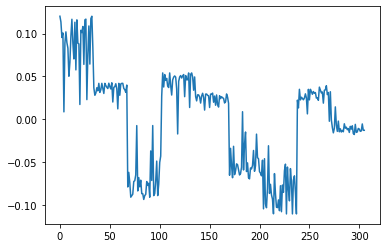

...

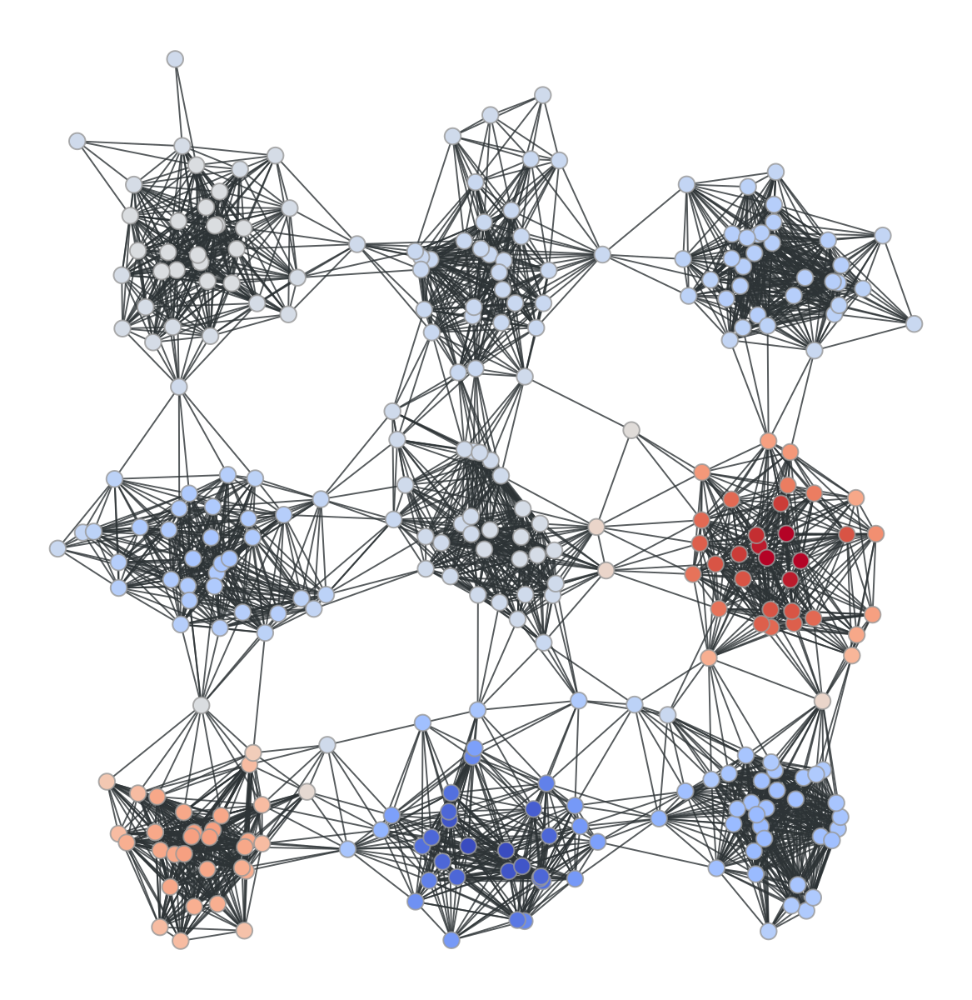

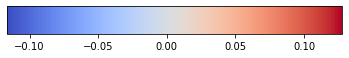

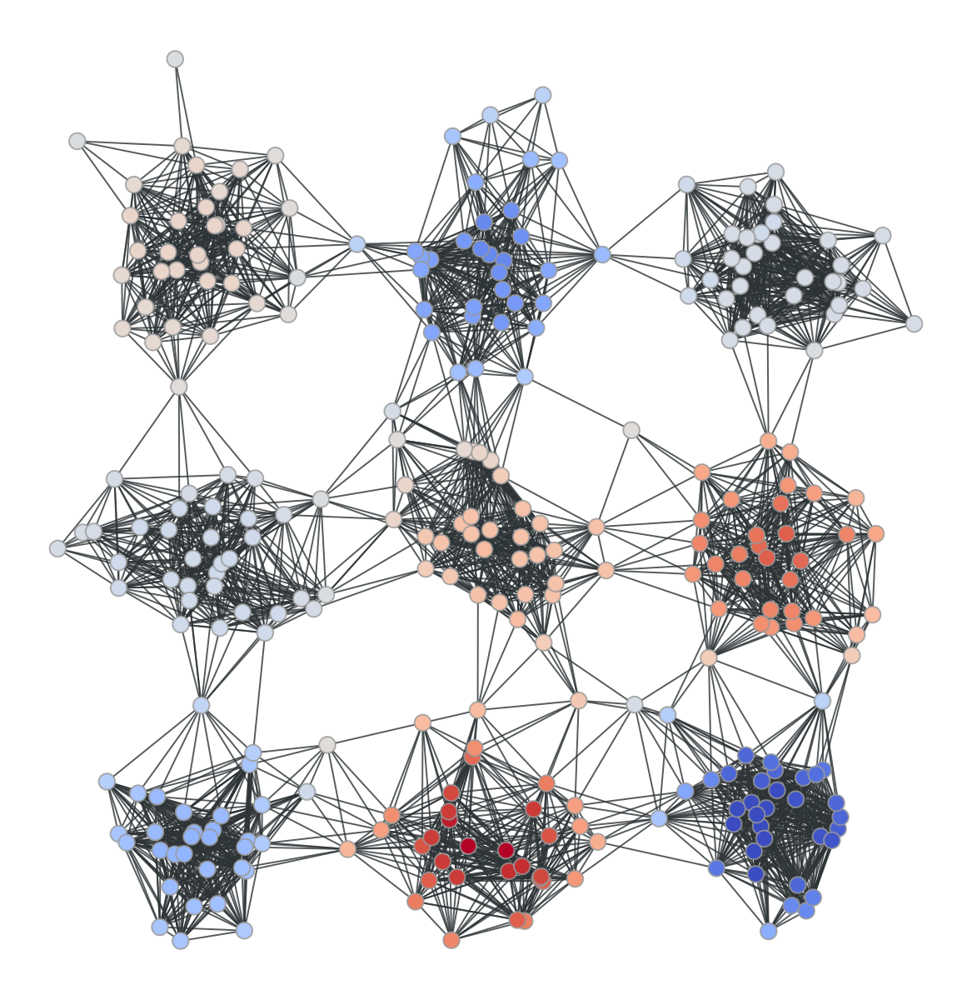

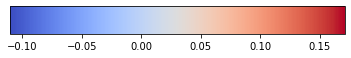

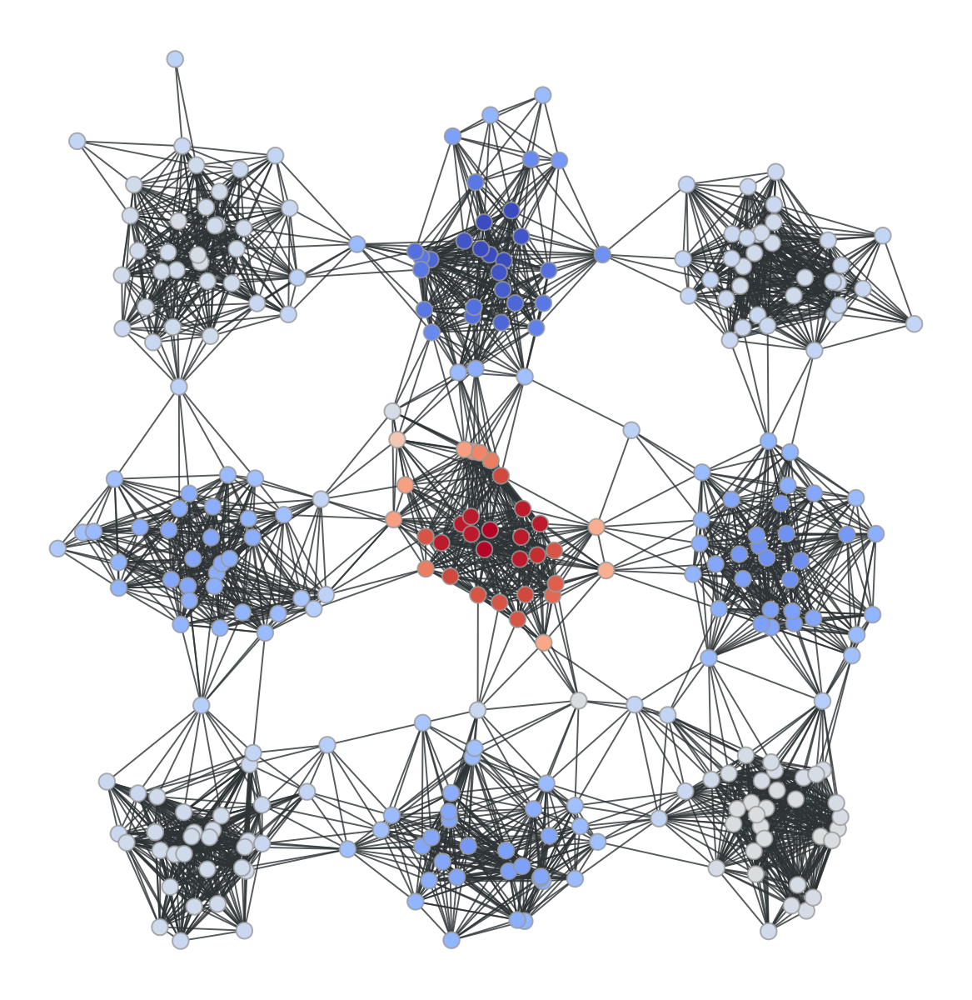

In [2]:
num_hubs = 9
num_vertices = 300
comm_size =  math.ceil(num_vertices/num_hubs)
size = comm_size*num_hubs
g, pos, points = create_graph()
P = transition(g)
evals, evecs = get_evals_evecs(P)
plt.figure(0)
plt.scatter(range(20), evals)
plot_evecs(num_hubs,evecs)
plt.show()
graph_plot_communities(num_hubs, evecs, pos)


        


In [ ]:
num_hubs = 5
num_vertices = 200
comm_size =  math.ceil(num_vertices/num_hubs)
size = comm_size*num_hubs
hubs = np.array([[0,0], [1,1], [1,0], [0,1], [1/2, 1/2]])
dvs = 0.05 + rd.rand(num_hubs)*0.2
points = np.empty((size, 2))
for i in range(num_hubs):
    points[comm_size*i:comm_size*(i+1), :] = np.random.normal(hubs[i, :], dvs[i], (comm_size, 2))
g, pos = geometric_graph(points, 0.4)
P = transition(g)
evals, evecs = get_evals_evecs(P)
plt.figure(0)
plt.scatter(range(20), evals)
plt.show()
graph_plot_communities(num_hubs, evecs, pos)


In [ ]:
num_hubs = 5
num_comm_vertices = 300
comm_size =  math.ceil(num_comm_vertices/num_hubs)
size = comm_size*num_hubs
hubs = np.array([[0,0], [1,1], [1,0], [0,1], [1/2, 1/2]])
points = np.empty((size, 2))
for i in range(num_hubs):
    points[comm_size*i:comm_size*(i+1), :] = np.random.normal(hubs[i, :], 0.01, (comm_size, 2))
points = np.append(points, np.random.rand(700,2), 0)
g, pos = geometric_graph(points, 0.1)
P = transition(g)
evals, evecs = get_evals_evecs(P)
graph_plot_communities(num_hubs, evecs, pos)



p = 2
P1 = get_transition_matrix(g, p)
evals1, evecs1 = get_evals_evecs(P1)
graph_plot_communities(num_hubs, evecs1, pos)
plt.scatter(range(20), evals)
plt.scatter(range(20), evals1)




PropertyArray([0.2])

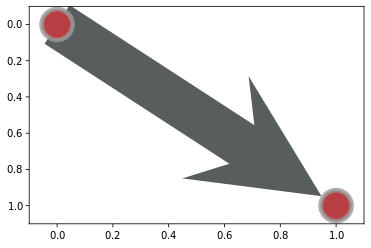

In [9]:
plt.switch_backend('cairo')
g = Graph()
g.add_vertex(2)
e = g.add_edge(0,1)
ew = g.new_ep('double')
ew[e] = 0.2
graph_draw(g, mplfig = plt.figure(), edge_pen_width = ew)
ew.a